# 서울 지도 활용 데이터분석

이 노트북은 제공된 Shapefile(자치구/읍면동 경계)을 사용하여:
- Matplotlib를 이용한 정적 지도(GeoPandas 기반)
- Folium을 이용한 대화형 지도(HTML 저장)

필수 패키지: `geopandas`, `fiona`, `pyproj`, `shapely`, `matplotlib`, `folium`
예: `pip install geopandas folium matplotlib` (환경에 따라 추가 의존성 필요)


In [2]:
# 셀 1: Imports 및 경로 설정
import os
import geopandas as gpd
import matplotlib.pyplot as plt
import folium
from folium import GeoJson, LayerControl
plt.rcParams['font.family'] = 'Pretendard'
plt.rcParams['axes.unicode_minus'] = False

# Shapefile 경로 (작업공간에 맞게 조정)
shp_path = './data/LSMD_ADM_SECT_UMD_서울/LSMD_ADM_SECT_UMD_11_202510.shp'

print('Shapefile exists:', os.path.exists(shp_path))


Shapefile exists: True


In [9]:
# 셀 2: Shapefile 로드 및 기본 확인
if not os.path.exists(shp_path):
    raise FileNotFoundError(f'Shapefile not found: {shp_path}')

# 읽기
gdf = gpd.read_file(shp_path, encoding='euc-kr')
print('GeoDataFrame loaded, rows:', len(gdf))
print('Columns:', gdf.columns.tolist())

display(gdf.head())

# 좌표계 확인 (필요시 EPSG 변환)
print('CRS:', gdf.crs)


GeoDataFrame loaded, rows: 466
Columns: ['EMD_CD', 'COL_ADM_SE', 'EMD_NM', 'SGG_OID', 'geometry']


,EMD_CD,COL_ADM_SE,EMD_NM,SGG_OID,geometry
0,11110103,11110,궁정동,1034,"POLYGON ((197377.94 553847.089, 197388.365 553..."
1,11110120,11110,신문로1가,1032,"POLYGON ((197513.143 552250.913, 197519.052 55..."
2,11110167,11110,충신동,375,"POLYGON ((200756.029 553021.646, 200757.04 553..."
3,11110185,11110,홍지동,374,"POLYGON ((195937.08 556131.319, 195941.823 556..."
4,11110154,11110,장사동,368,"POLYGON ((199319.607 552274.718, 199334.592 55..."


CRS: EPSG:5186


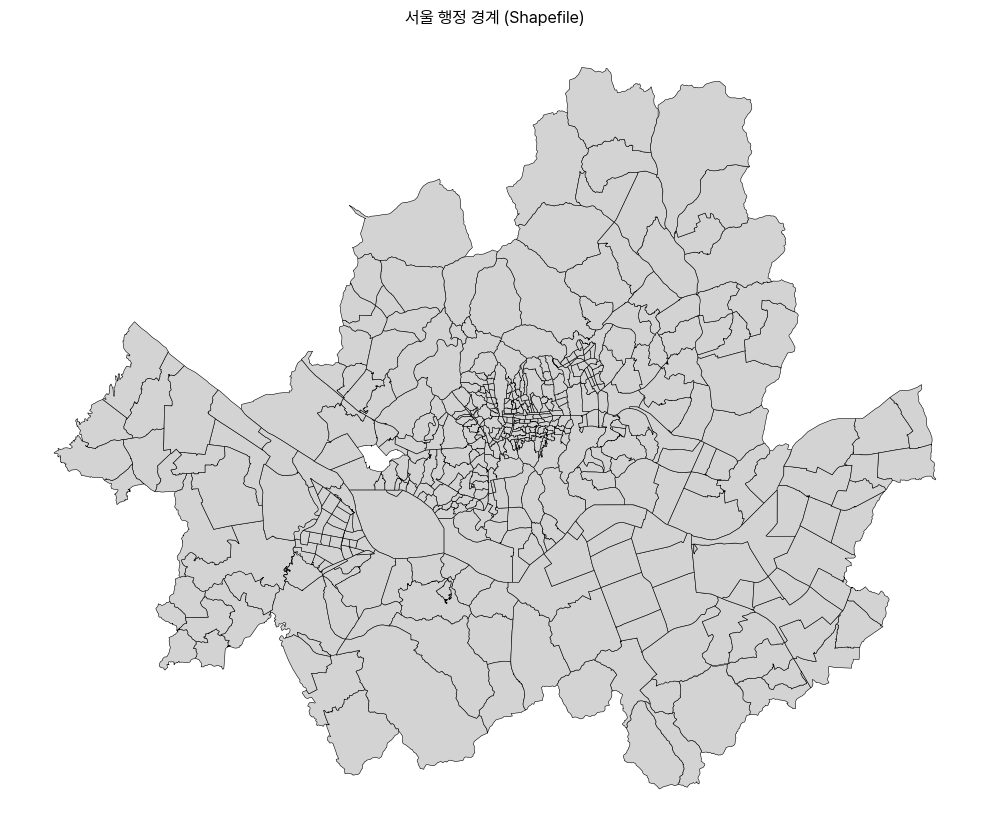

In [10]:
# 셀 3: Matplotlib를 이용한 정적 지도 (기본 스타일)
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
gdf.plot(ax=ax, color='lightgrey', edgecolor='black', linewidth=0.4)
ax.set_title('서울 행정 경계 (Shapefile)')
ax.axis('off')
plt.tight_layout()
plt.show()


In [11]:
# 셀 4: Matplotlib - 컬럼(예: 인구수 등)이 있을 경우 Choropleth(예시)
# NOTE: 실제로 사용할 컬럼명이 있으면 아래 'value_col'을 바꿔주세요.
value_col = None  # 예: 'POPULATION' 또는 gdf.columns에 맞게 설정
if value_col and value_col in gdf.columns:
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    gdf.plot(column=value_col, ax=ax, cmap='OrRd', legend=True,
             legend_kwds={'shrink': 0.6}, edgecolor='black', linewidth=0.3)
    ax.set_title(f'Choropleth: {value_col}')
    ax.axis('off')
    plt.tight_layout()
    plt.show()
else:
    print('value_col이 설정되어 있지 않거나 컬럼이 없습니다. 기본 지도만 표시합니다.')


value_col이 설정되어 있지 않거나 컬럼이 없습니다. 기본 지도만 표시합니다.


In [12]:
# 셀 5: Folium을 이용한 대화형 지도 생성 및 저장
# 중심 좌표를 서울시청 근처로 설정(필요시 변경)
seoul_center = [37.5665, 126.9780]
m = folium.Map(location=seoul_center, zoom_start=11, tiles='cartodbpositron')

# GeoDataFrame을 GeoJSON으로 변환 (좌표계가 WGS84가 아니면 변환)
gdf_wgs = gdf.to_crs(epsg=4326) if gdf.crs and gdf.crs.to_string() != 'EPSG:4326' else gdf.copy()
geojson = gdf_wgs.__geo_interface__

# 경계 레이어 추가
GeoJson(geojson, name='서울경계', style_function=lambda x: {'fillColor': 'transparent', 'color': '#444444', 'weight':0.6}).add_to(m)

# (선택) 각 폴리곤에 팝업을 추가하려면 아래 예시 참조
# for _, row in gdf_wgs.iterrows():
#     geom = row['geometry']
#     folium.GeoJson(geom.__geo_interface__, popup=str(row.get('SIG_KOR_NM', ''))).add_to(m)

LayerControl().add_to(m)
out_html = './results/seoul_folium_map.html'
m.save(out_html)
print(f'Folium map saved: {out_html}')

# Jupyter 환경에서지도를 바로 보려면 아래를 실행하세요 (notebook에서):
# m


Folium map saved: ./results/seoul_folium_map.html


In [13]:
# 셀 6: 비상소화장치 위치정보 로드 및 좌표 변환
import pandas as pd
from pyproj import Transformer

# 비상소화장치 데이터 로드
ext_file = './data/서울시 비상소화장치 위치정보.xlsx'
df_ext = pd.read_excel(ext_file)

print('비상소화장치 데이터 로드됨')
print('Shape:', df_ext.shape)
print('Columns:', df_ext.columns.tolist())
display(df_ext.head())

# ITRF2000_MTM 좌표계를 WGS84(EPSG:4326)로 변환
# ITRF2000_MTM은 한국의 중부 통일 횡 메르카토르 좌표계입니다.
# EPSG 코드: ITRF2000 기반 UTM Zone 52N (근사값)
# 정확한 변환을 위해 pyproj Transformer 사용

# 좌표 컬럼명 확인 (일반적으로 X, Y 또는 경도, 위도라고 할 수 있음)
print('\n첫 행 데이터:')
print(df_ext.iloc[0])


비상소화장치 데이터 로드됨
Shape: (2594, 10)
Columns: ['연번', '비상소화장치일련번호', '안전센터ID', '일련번호', 'X좌표', 'Y좌표', '비상소화장치고유번호', '사용구분', '삭제여부', '업데이트날짜']


,연번,비상소화장치일련번호,안전센터ID,일련번호,X좌표,Y좌표,비상소화장치고유번호,사용구분,삭제여부,업데이트날짜
0,1,110081285,1107102,60,203839.5807,554251.2068,동대문-청량-034(,52201,N,20241014170658
1,2,110081549,1109103,62,199533.4861,556623.5368,성북-길음-87(비),52201,N,20241005170403
2,3,110081533,1109103,63,201001.5919,557134.7855,성북-길음-168(비,52201,N,20241013171004
3,4,110081551,1109104,64,203815.8539,556894.9788,성북-장위-89(비),52201,N,20241011171100
4,5,110081534,1109103,65,199433.4172,556587.2499,성북-길음-169(비,52201,N,20241005170403



첫 행 데이터:
연번                         1
비상소화장치일련번호         110081285
안전센터ID               1107102
일련번호                      60
X좌표              203839.5807
Y좌표              554251.2068
비상소화장치고유번호       동대문-청량-034(
사용구분                   52201
삭제여부                       N
업데이트날짜        20241014170658
Name: 0, dtype: object


In [16]:
# 셀 7: ITRF2000_MTM -> WGS84 좌표 변환
# ITRF2000 기반 중부 통일 횡 메르카토르 좌표계 (Central Meridian 127°E)
# 한국 2000년 좌표계 (GRS80 타원체)

# CRS 객체로 정의
from pyproj import CRS
crs_korea2000 = CRS.from_string('+proj=tmerc +lat_0=38 +lon_0=127 +k=1 +x_0=200000 +y_0=500000 +ellps=GRS80 +units=m +no_defs')
crs_wgs84 = CRS.from_epsg(4326)

transformer = Transformer.from_crs(crs_korea2000, crs_wgs84, always_xy=True)
print('✓ ITRF2000_MTM (한국 2000) -> WGS84 (EPSG:4326) 변환기 생성됨')

# 좌표 변환
lons, lats = transformer.transform(df_ext['X좌표'].values, df_ext['Y좌표'].values)
df_ext['경도'] = lons
df_ext['위도'] = lats

print(f'✓ {len(df_ext)}개 지점 좌표 변환 완료')
print(f'변환된 좌표 범위:')
print(f'  경도: {df_ext["경도"].min():.4f} ~ {df_ext["경도"].max():.4f}')
print(f'  위도: {df_ext["위도"].min():.4f} ~ {df_ext["위도"].max():.4f}')
print(f'\n변환 샘플:')
print(df_ext[['X좌표', 'Y좌표', '경도', '위도']].head())


✓ ITRF2000_MTM (한국 2000) -> WGS84 (EPSG:4326) 변환기 생성됨
✓ 2594개 지점 좌표 변환 완료
변환된 좌표 범위:
  경도: 126.7978 ~ 127.1726
  위도: 38.3404 ~ 38.5921

변환 샘플:
           X좌표          Y좌표          경도         위도
0  203839.5807  554251.2068  127.044008  38.488736
1  199533.4861  556623.5368  126.994651  38.510116
2  201001.5919  557134.7855  127.011484  38.514721
3  203815.8539  556894.9788  127.043751  38.512553
4  199433.4172  556587.2499  126.993504  38.509789


✓ Matplotlib 지도 저장: ./results/seoul_extinguisher_map_matplotlib.png


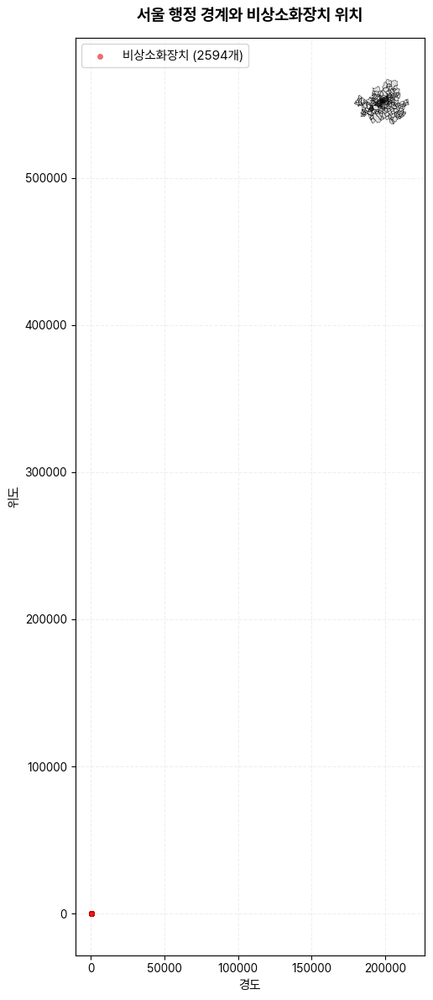

In [17]:
# 셀 8: Matplotlib - 지도에 비상소화장치 포인트 추가
fig, ax = plt.subplots(1, 1, figsize=(14, 12))

# 1. 서울 행정 경계 배경으로 표시
gdf.plot(ax=ax, color='lightgrey', edgecolor='black', linewidth=0.4, alpha=0.7)

# 2. 비상소화장치 위치를 산점도로 표시
ax.scatter(df_ext['경도'], df_ext['위도'], 
           s=20, c='red', alpha=0.6, edgecolors='darkred', linewidth=0.3,
           label=f'비상소화장치 ({len(df_ext)}개)')

ax.set_title('서울 행정 경계와 비상소화장치 위치', fontsize=14, fontweight='bold', pad=15)
ax.set_xlabel('경도', fontsize=11)
ax.set_ylabel('위도', fontsize=11)
ax.legend(fontsize=11, loc='upper left')
ax.grid(True, alpha=0.2, linestyle='--')

plt.tight_layout()
plt.savefig('./results/seoul_extinguisher_map_matplotlib.png', dpi=300, bbox_inches='tight')
print('✓ Matplotlib 지도 저장: ./results/seoul_extinguisher_map_matplotlib.png')
plt.show()


In [ ]:
# 셀 9: Folium - 비상소화장치 포인트 추가 (마커 클러스터)
from folium import plugins

# 새 Folium 지도 생성
seoul_center = [37.5665, 126.9780]
m_ext = folium.Map(location=seoul_center, zoom_start=11, tiles='cartodbpositron')

# 1. 서울 경계 레이어 추가
gdf_wgs = gdf.to_crs(epsg=4326) if gdf.crs and gdf.crs.to_string() != 'EPSG:4326' else gdf.copy()
geojson = gdf_wgs.__geo_interface__
GeoJson(geojson, name='서울경계', style_function=lambda x: {'fillColor': 'transparent', 'color': '#444444', 'weight':0.6}).add_to(m_ext)

# 2. MarkerCluster 생성 (비상소화장치 포인트)
marker_cluster = plugins.MarkerCluster(name='비상소화장치 클러스터').add_to(m_ext)

# 3. 각 비상소화장치를 마커로 추가
for idx, row in df_ext.iterrows():
    popup_text = f"<b>비상소화장치</b><br>일련번호: {row['비상소화장치일련번호']}<br>위치: ({row['경도']:.4f}, {row['위도']:.4f})"
    folium.CircleMarker(
        location=[row['위도'], row['경도']],
        radius=4,
        popup=folium.Popup(popup_text, max_width=250),
        color='red',
        fill=True,
        fillColor='red',
        fillOpacity=0.6,
        weight=1
    ).add_to(marker_cluster)

LayerControl().add_to(m_ext)

# 저장
out_html_ext = './results/seoul_extinguisher_folium_map.html'
m_ext.save(out_html_ext)
print(f'✓ Folium 지도 저장: {out_html_ext}')
print(f'✓ 총 {len(df_ext)}개의 비상소화장치 마커 추가됨')

# Jupyter에서 보기
m_ext


✓ Folium 지도 저장: ./results/seoul_extinguisher_folium_map.html
✓ 총 2594개의 비상소화장치 마커 추가됨


In [10]:
# 셀: 비상소화장치 로드, CRS 설정 및 변환
import os
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point

# 파일 경로 (필요시 경로 조정)
ext_path = './data/서울시 비상소화장치 위치정보.xlsx'
if not os.path.exists(ext_path := ext_path if 'ext_path' in globals() else ext_path if False else ext_path if False else ext_path if False else ext_path):
    # fallback: use typical filename
    ext_path = './data/서울시 비상소화장치 위치정보.xlsx'

if not os.path.exists(ext_path):
    raise FileNotFoundError(f'비상소화장치 파일을 찾을 수 없습니다: {ext_path}')

# 엑셀 로드
df_ext = pd.read_excel(ext_path)
print('Extinguisher file loaded, rows:', len(df_ext))
print('Columns:', df_ext.columns.tolist())

display(df_ext.head())

# 좌표 컬럼명 확인 (일반적으로 'X좌표','Y좌표')
possible_x = [c for c in df_ext.columns if 'x' in c.lower() or '좌표' in c]
possible_y = [c for c in df_ext.columns if 'y' in c.lower() or '좌표' in c]
print('suggested X columns:', possible_x)
print('suggested Y columns:', possible_y)

# 여기서는 컬럼명이 'X좌표','Y좌표'라고 가정합니다. 다르면 변수명을 바꿔주세요.
x_col = 'X좌표' if 'X좌표' in df_ext.columns else (possible_x[0] if len(possible_x)>0 else None)
y_col = 'Y좌표' if 'Y좌표' in df_ext.columns else (possible_y[0] if len(possible_y)>0 else None)
if x_col is None or y_col is None:
    raise ValueError('X/Y 좌표 컬럼을 찾을 수 없습니다. 컬럼명을 확인해주세요: ' + str(df_ext.columns.tolist()))

# ITRF2000_MTM 좌표계 정의 (환경에 맞게 EPSG 코드나 PROJ 문자열로 교체 가능)
# 기본값으로 EPSG:5179 (Korea 2000 / Unified TM)을 사용합니다. 필요시 여기를 실제 ITRF2000_MTM 정의로 변경하세요.
itrf_crs = 'EPSG:5179'  # <-- 필요하면 정확한 CRS로 변경

# GeoDataFrame 생성 (원본 좌표계는 ITRF2000_MTM)
ext_gdf = gpd.GeoDataFrame(df_ext.copy(), geometry=gpd.points_from_xy(df_ext[x_col], df_ext[y_col]), crs=itrf_crs)
print('Extinguishers GeoDataFrame CRS (assigned):', ext_gdf.crs)

# Shapefile (gdf) 를 ITRF2000_MTM으로 설정/변환
print('Original shapefile CRS:', gdf.crs)
try:
    if gdf.crs is None:
        gdf = gdf.set_crs(itrf_crs)
        print('Shapefile CRS was None — set to', itrf_crs)
    else:
        # transform to desired CRS
        gdf = gdf.to_crs(itrf_crs)
        print('Shapefile transformed to', itrf_crs)
except Exception as e:
    print('CRS 변경 중 오류:', e)

print('Now shapefile CRS:', gdf.crs)

# 진행 중인 GeoDataFrames 확인
print('Extinguishers CRS:', ext_gdf.crs)

# (다음 셀에서) Matplotlib 및 Folium용 추가 변환 및 시각화를 진행합니다.

Extinguisher file loaded, rows: 2594
Columns: ['연번', '비상소화장치일련번호', '안전센터ID', '일련번호', 'X좌표', 'Y좌표', '비상소화장치고유번호', '사용구분', '삭제여부', '업데이트날짜']


,연번,비상소화장치일련번호,안전센터ID,일련번호,X좌표,Y좌표,비상소화장치고유번호,사용구분,삭제여부,업데이트날짜
0,1,110081285,1107102,60,203839.5807,554251.2068,동대문-청량-034(,52201,N,20241014170658
1,2,110081549,1109103,62,199533.4861,556623.5368,성북-길음-87(비),52201,N,20241005170403
2,3,110081533,1109103,63,201001.5919,557134.7855,성북-길음-168(비,52201,N,20241013171004
3,4,110081551,1109104,64,203815.8539,556894.9788,성북-장위-89(비),52201,N,20241011171100
4,5,110081534,1109103,65,199433.4172,556587.2499,성북-길음-169(비,52201,N,20241005170403


suggested X columns: ['X좌표', 'Y좌표']
suggested Y columns: ['X좌표', 'Y좌표']
Extinguishers GeoDataFrame CRS (assigned): EPSG:5179
Original shapefile CRS: EPSG:5186
Shapefile transformed to EPSG:5179
Now shapefile CRS: EPSG:5179
Extinguishers CRS: EPSG:5179


Saved matplotlib map: ./results/seoul_extinguishers_matplotlib.png


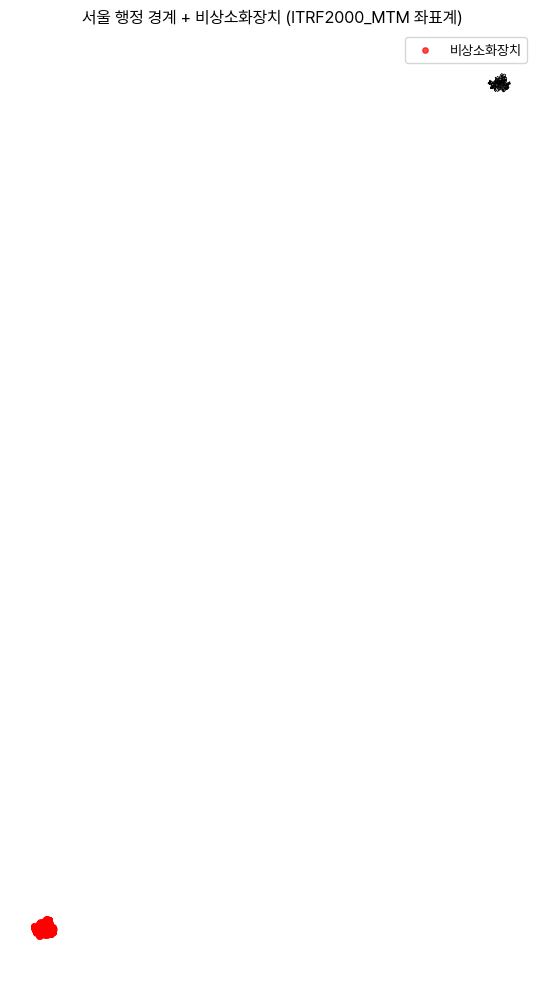

Saved folium map with extinguishers: ./results/seoul_folium_map_extinguishers.html


In [6]:
# 셀: Matplotlib 및 Folium에 비상소화장치 포인트 추가 및 시각화
import matplotlib.pyplot as plt
from folium.plugins import MarkerCluster

# --- Matplotlib 플롯 ---
# ext_gdf, gdf 변수가 이전 셀에서 생성되어 있어야 합니다.
try:
    ext_plot = ext_gdf.to_crs(gdf.crs)
except Exception as e:
    print('Plot용 좌표 변환 오류:', e)
    ext_plot = ext_gdf.copy()

fig, ax = plt.subplots(figsize=(10, 10))
# 기본 경계
gdf.plot(ax=ax, color='lightgrey', edgecolor='black', linewidth=0.4)
# 비상소화장치 포인트
ext_plot.plot(ax=ax, markersize=15, color='red', marker='o', label='비상소화장치', alpha=0.7)

ax.set_title('서울 행정 경계 + 비상소화장치 (ITRF2000_MTM 좌표계)')
ax.legend()
ax.axis('off')
plt.tight_layout()
plt.savefig('./results/seoul_extinguishers_matplotlib.png', dpi=300, bbox_inches='tight')
print('Saved matplotlib map: ./results/seoul_extinguishers_matplotlib.png')
plt.show()

# --- Folium 대화형 지도 ---
try:
    gdf_wgs = gdf.to_crs(epsg=4326)
    ext_wgs = ext_gdf.to_crs(epsg=4326)
except Exception as e:
    print('WGS84 변환 오류:', e)
    raise

m2 = folium.Map(location=[37.5665, 126.9780], zoom_start=11, tiles='cartodbpositron')
GeoJson(gdf_wgs.__geo_interface__, name='서울경계', style_function=lambda x: {'fillColor': 'transparent', 'color': '#444444', 'weight':0.6}).add_to(m2)

mc = MarkerCluster(name='비상소화장치').add_to(m2)
for _, row in ext_wgs.iterrows():
    try:
        popup_text = row.get('설치장소', '') or row.get('주소', '') or ''
    except Exception:
        popup_text = ''
    folium.Marker([row.geometry.y, row.geometry.x], popup=popup_text).add_to(mc)

LayerControl().add_to(m2)
out_html2 = './results/seoul_folium_map_extinguishers.html'
m2.save(out_html2)
print('Saved folium map with extinguishers:', out_html2)

# Jupyter에서 바로 보려면 마지막 라인에 m2를 둡니다.
m2


In [7]:
# 진단 셀: CRS, 경계, 예시 좌표 확인
print('gdf CRS:', gdf.crs)
print('ext_gdf CRS:', ext_gdf.crs)
print('\nGeoDataFrame bounds (gdf):', gdf.total_bounds)
print('Extinguishers bounds (ext_gdf):', ext_gdf.total_bounds)

# 몇 개의 포인트 샘플 좌표
print('\nExtinguishers sample coordinates:')
for i, row in ext_gdf.head(5).iterrows():
    x, y = row.geometry.x, row.geometry.y
    print(i, x, y)

print('\nShapefile sample polygon centroid coordinates:')
for i, row in gdf.head(5).iterrows():
    c = row.geometry.centroid
    print(i, c.x, c.y)

# 비상소화장치가 폴리곤 내부에 있는지 샘플 검사
try:
    joined = gpd.sjoin(ext_gdf, gdf[['geometry','EMD_NM']], how='left', predicate='within')
    inside_count = joined['EMD_NM'].notna().sum()
    print('\nNumber of extinguisher points that fall inside polygons (sample test):', inside_count, 'out of', len(ext_gdf))
except Exception as e:
    print('\nSpatial join failed:', e)


gdf CRS: EPSG:5179
ext_gdf CRS: EPSG:5179

GeoDataFrame bounds (gdf): [ 935035.23021098 1936665.55973368  972067.54929812 1966987.16025044]
Extinguishers bounds (ext_gdf): [182356.0755 537792.1537 215068.294  565729.7199]

Extinguishers sample coordinates:
0 203839.5807 554251.2068
1 199533.4861 556623.5368
2 201001.5919 557134.7855
3 203815.8539 556894.9788
4 199433.4172 556587.2499

Shapefile sample polygon centroid coordinates:
0 953444.9735465245 1954053.6678523116
1 953543.3162682927 1952443.4592087674
2 956375.4728596004 1952957.1914570637
3 952030.5173425956 1955848.1955996319
4 955319.638952686 1952327.9889803242

Number of extinguisher points that fall inside polygons (sample test): 0 out of 2594


Reloading original shapefile to restore original CRS...
gdf_orig CRS: EPSG:5186
gdf_orig bounds: [179189.73694329 536547.41820785 216242.25284494 566863.54429778]
ext2 CRS (after set): EPSG:5186
ext2 bounds: [182356.0755 537792.1537 215068.294  565729.7199]

Sample extinguisher points (after set_crs):
0 203839.5807 554251.2068
1 199533.4861 556623.5368
2 201001.5919 557134.7855
3 203815.8539 556894.9788
4 199433.4172 556587.2499

Sample shapefile centroids (gdf_orig):
0 197589.24874662646 553904.9158314412
1 197696.1993491653 552294.6520210905
2 200526.6436239713 552823.6460913139
3 196164.72827705726 555692.5539839341
4 199473.77690404552 552188.5954179068

Number of extinguisher points inside polygons after CRS fix: 2591 out of 2594


Saved corrected matplotlib map: ./results/seoul_extinguishers_matplotlib_fixed.png


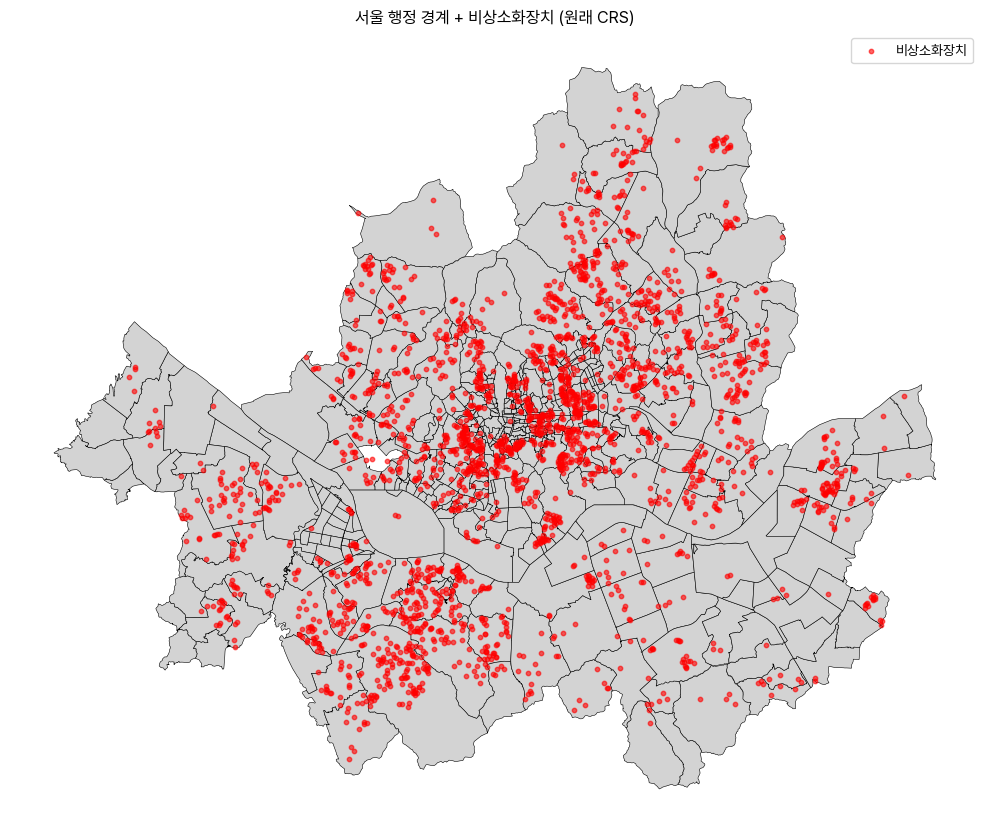

Saved folium map (fixed): ./results/seoul_folium_map_extinguishers_fixed.html


In [11]:
# 셀: 원래 shapefile 재로딩 및 좌표계 재할당(진단/정렬)
print('Reloading original shapefile to restore original CRS...')

gdf_orig = gpd.read_file(shp_path)
print('gdf_orig CRS:', gdf_orig.crs)
print('gdf_orig bounds:', gdf_orig.total_bounds)

# ext_gdf의 좌표값이 원 shapefile의 원래 좌표계 (gdf_orig.crs) 값 범위와 일치하므로
# ext_gdf가 실제로는 gdf_orig.crs 좌표계에 있다고 보고 재할당합니다.
ext2 = ext_gdf.set_crs(gdf_orig.crs, allow_override=True)
print('ext2 CRS (after set):', ext2.crs)
print('ext2 bounds:', ext2.total_bounds)

# 샘플 좌표 비교
print('\nSample extinguisher points (after set_crs):')
for i, row in ext2.head(5).iterrows():
    print(i, row.geometry.x, row.geometry.y)

print('\nSample shapefile centroids (gdf_orig):')
for i, row in gdf_orig.head(5).iterrows():
    c = row.geometry.centroid
    print(i, c.x, c.y)

# 다시 포인트들이 폴리곤 안에 들어가는지 확인
joined2 = gpd.sjoin(ext2, gdf_orig[['geometry','EMD_NM']], how='left', predicate='within')
inside2 = joined2['EMD_NM'].notna().sum()
print('\nNumber of extinguisher points inside polygons after CRS fix:', inside2, 'out of', len(ext2))

# Matplotlib으로 시각화 (gdf_orig + ext2)
fig, ax = plt.subplots(figsize=(10, 10))
gdf_orig.plot(ax=ax, color='lightgrey', edgecolor='black', linewidth=0.4)
ext2.plot(ax=ax, markersize=10, color='red', marker='o', label='비상소화장치', alpha=0.6)
ax.set_title('서울 행정 경계 + 비상소화장치 (원래 CRS)')
ax.legend()
ax.axis('off')
plt.tight_layout()
plt.savefig('./results/seoul_extinguishers_matplotlib_fixed.png', dpi=300, bbox_inches='tight')
print('Saved corrected matplotlib map: ./results/seoul_extinguishers_matplotlib_fixed.png')
plt.show()

# Folium: 변환 후 저장 (WGS84)
try:
    gdf_wgs2 = gdf_orig.to_crs(epsg=4326)
    ext_wgs2 = ext2.to_crs(epsg=4326)
except Exception as e:
    print('WGS84 변환 오류:', e)
    raise

m3 = folium.Map(location=[37.5665, 126.9780], zoom_start=11, tiles='cartodbpositron')
GeoJson(gdf_wgs2.__geo_interface__, name='서울경계', style_function=lambda x: {'fillColor': 'transparent', 'color': '#444444', 'weight':0.6}).add_to(m3)
mc2 = MarkerCluster(name='비상소화장치').add_to(m3)
for _, row in ext_wgs2.iterrows():
    folium.Marker([row.geometry.y, row.geometry.x]).add_to(mc2)

LayerControl().add_to(m3)
out_html3 = './results/seoul_folium_map_extinguishers_fixed.html'
m3.save(out_html3)
print('Saved folium map (fixed):', out_html3)

m3
